Getting Reviews for competitor games on Steam

In [38]:
%pip install python-dotenv
%pip install requests pandas
%pip install matplotlib
%pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
^C
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [ ]:
# Import packages
import nltk
from pprint import pprint
import yaml
import sys
import os
import re
import requests
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [ ]:
ubisoft_workplace_df=pd.read_csv('ubisoft_reviews.csv', encoding='ISO-8859-1')

playstation_workplace_df=pd.read_csv('playstation_reviews.csv', encoding='ISO-8859-1')

In [ ]:
ubisoft_workplace_df["Pros"].head()

0                Great people, good work-life balance.
1    - Comp time for OT - People are great, work cu...
2    Depends on the team, but I am given a lot of f...
3    Chance to work on some good games and get good...
4              Young and lively environment to work in
Name: Pros, dtype: object

In [ ]:
playstation_workplace_df.head()

,Position,Rating,Review Title,Role,Pros,Cons
0,1,5,Nice place to work on,Engineer,great senior and good career path,lot of urgent task to do
1,2,4,Playstation,Marketing manager,Its PlayStation - whats there to say,Japanese Company - top down management
2,3,5,Work life balance,Graphic designer,Where can you play and work at the same time~ ...,No con cus it was really fun working there
3,4,1,One of the worst,Anonymous employee,Small perks like freebies once in a while.,50% of immediate co-workers are assassins who ...
4,5,2,Traditional working culture,Product manager,"There's always something exciting happening, a...",Traditional Japanese working culture is preval...


In [57]:
print(ubisoft_workplace_df["Rating"].mean())
print(playstation_workplace_df["Rating"].mean())

3.586
3.652


great people, good work-life balance. - comp time for ot - people are great, work culture is respectful - inter-project mobility. i never hear of people being let go at the end of a project depends on the team, but i am given a lot of freedom on how to solve tasks. hr does take care of people and organises events for welfare. chance to work on some good games and get good experience
clubs can be a fun addition to work young and lively environment to work in the possibility of working on big projects and being around amazing developers great culture, good hr, great welfare as a model artist, it's challenging to start level art. by figuring out a lot of methods and asking colleagues and team leaders for advice, i was able to get started quickly and complete the project tasks successfully.all my supervisors have recognised my personal attitude towards work and my ability to learn. i was lucky enough to work with some talented artist, company really care about the people there interesting 

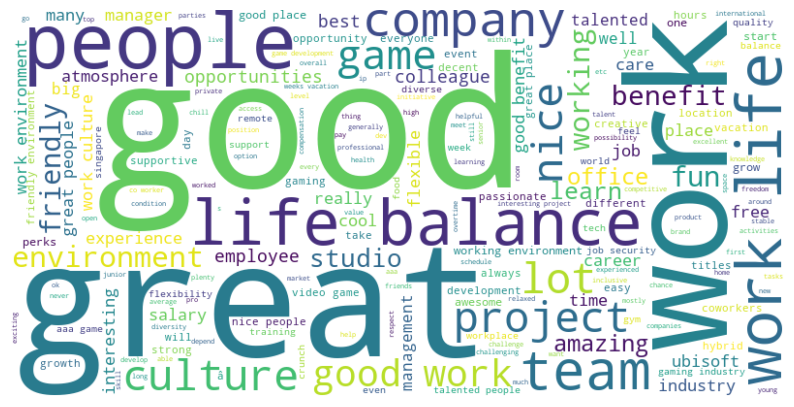

In [ ]:
# Combine all post titles and bodies for the word cloud
ubisoft_pos_sentiment = ' '.join(ubisoft_workplace_df['Pros'].astype(str)).lower()
print(ubisoft_pos_sentiment)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(ubisoft_pos_sentiment)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


relatively low salary compared to other company. - bonuses are basically non-existent so far during my time here. company wasn't doing well last year. - the pay raise last year was extremely low, at 1.7% for me, and it is known that there were 0% increases for certain job levels. - in my project, it felt understaffed but overdemanding. all of us had to do more than was healthy for work-life balance, and even though there was comp time for ot, not being able to spend all of it was an actual concern as the project could not afford some people to leave. it should be noted that i have never heard of leave being unapproved for this reason however, but there is stress coming from expectations and sense of responsibility to consider. short timeline means you fix stuff even if it's spaghetti code or temp fixes. many temp fixes builds up tech or design debt that creates a cursed problem. slow growth and challenge
politics exist as with large companies no 13 month bonus, unable to have quick car

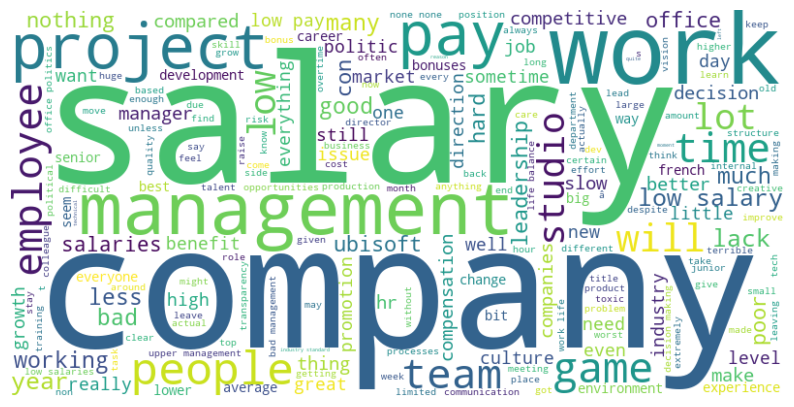

In [ ]:
# Combine all post titles and bodies for the word cloud
ubisoft_neg_sentiment = ' '.join(ubisoft_workplace_df['Cons'].astype(str)).lower()
print(ubisoft_neg_sentiment)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(ubisoft_neg_sentiment)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


great senior and good career path its playstation - whats there to say where can you play and work at the same time~ fun environment and diverse small perks like freebies once in a while. there's always something exciting happening, and if you're a playstation fan, you'll love just being in the company and a part of it. it's impossible to get bored due to the fast-changing pace. high technology and services receivers to family entertainment professionals. produces amazing hardware and exciting software good salary despite long hours pay well. good benefits. progress great benefits, great pay, and you get to play video games. working from home policy. i loved it best place i have ever worked colleagues are the best part of it work life balance is good. great benefits - friendly qa teams - process driven very competitive team, great benefits, creative culture fully remote
great wlb
free games i really enjoy working at playstation. there are many great designers in the org both in america

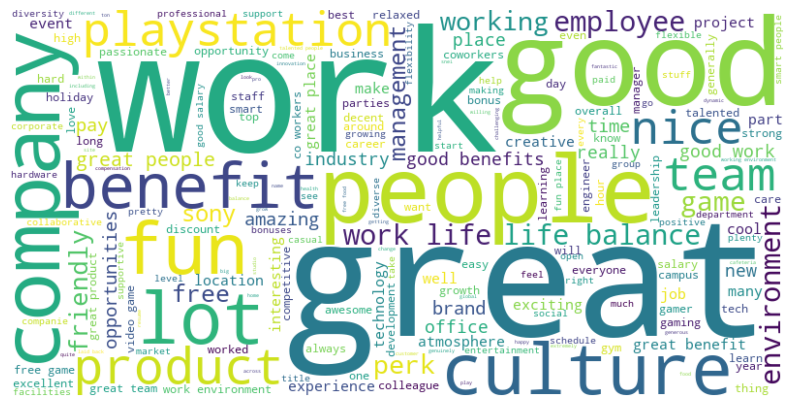

In [39]:
# Combine all post titles and bodies for the word cloud
playstation_pos_sentiment = ' '.join(playstation_workplace_df['Pros'].astype(str)).lower()
print(playstation_pos_sentiment)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(playstation_pos_sentiment)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


lot of urgent task to do japanese company - top down management no con cus it was really fun working there 50% of immediate co-workers are assassins who have no qualms backstabbing you to gain favour with the japanese management. japanese management side with each other and help each other to promote. extreme favoritism and bias-ness, no career progression for you no matter how talanted you are if you don't bootlick them. super manual jobscope that can be eliminated with better systems. decent starting pay but you won't get any higher without bootlicking as well. make tons of excuses to deny promotion yet promotion is granted to best friends and bootlickers who have minimal contributions. if you're new or young, forget about trying to make an impact as they deem you to be inexperienced and your word can't be taken for. horrendous company. traditional japanese working culture is prevalent due to largely japanese leadership. e.g. rigid rules, hierarchical, poor work-life balance, yes-man

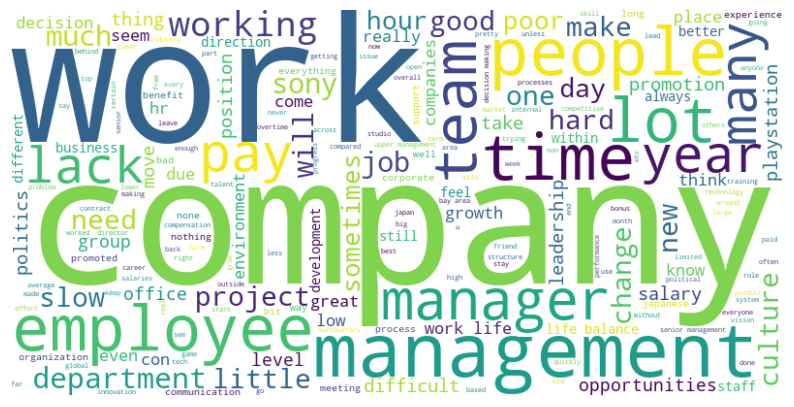

In [40]:

# Combine all post titles and bodies for the word cloud
playstation_neg_sentiment = ' '.join(playstation_workplace_df['Cons'].astype(str)).lower()
print(playstation_neg_sentiment)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(playstation_neg_sentiment)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [60]:
dict_tagged_sentences = ''
# Below indicates the relative path to
# positive/negative/inverter/incrementer/decrementer files
DICTIONARY_DIR_PREFIX = 'dict/'

In [47]:
class Splitter(object):
    def __init__(self):
        self.nltk_splitter = nltk.data.load('tokenizers/punkt/english.pickle')
        self.nltk_tokenizer = nltk.tokenize.TreebankWordTokenizer()

    def split(self, text):
        """
        input format: a paragraph of text
        output format: a list of lists of words.
            e.g.: [['this', 'is', 'a', 'sentence'], ['this', 'is', 'another', 'one']]
        """
        sentences = self.nltk_splitter.tokenize(text)
        tokenized_sentences = [self.nltk_tokenizer.tokenize(sent) for sent in sentences]
        return tokenized_sentences


class POSTagger(object):
    def __init__(self):
        pass

    def pos_tag(self, sentences):
        """
        input format: list of lists of words
            e.g.: [['this', 'is', 'a', 'sentence'], ['this', 'is', 'another', 'one']]
        output format: list of lists of tagged tokens. Each tagged tokens has a
        form, a lemma, and a list of tags
            e.g: [[('this', 'this', ['DT']), ('is', 'be', ['VB']), ('a', 'a', ['DT']), ('sentence', 'sentence', ['NN'])],
                    [('this', 'this', ['DT']), ('is', 'be', ['VB']), ('another', 'another', ['DT']), ('one', 'one', ['CARD'])]]
        """

        pos = [nltk.pos_tag(sentence) for sentence in sentences]
        #adapt format
        pos = [[(word, word, [postag]) for (word, postag) in sentence] for sentence in pos]
        return pos

class DictionaryTagger(object):
    def __init__(self, dictionary_paths):
        """

        :rtype : object
        """
        files = [open(path, 'r') for path in dictionary_paths]
        dictionaries = [yaml.full_load(dict_file) for dict_file in files]
        map(lambda x: x.close(), files)
        self.dictionary = {}
        self.max_key_size = 0
        for curr_dict in dictionaries:
            for key in curr_dict:
                if key in self.dictionary:
                    self.dictionary[key].extend(curr_dict[key])
                else:
                    self.dictionary[key] = curr_dict[key]
                    # self.max_key_size = max(self.max_key_size, len(key))

    def tag(self, postagged_sentences):
        return [self.tag_sentence(sentence) for sentence in postagged_sentences]

    def tag_sentence(self, sentence, tag_with_lemmas=False):
        """
        the result is only one tagging of all the possible ones.
        The resulting tagging is determined by these two priority rules:
            - longest matches have higher priority
            - search is made from left to right
        """
        tag_sentence = []
        N = len(sentence)
        if self.max_key_size == 0:
            self.max_key_size = N
        i = 0
        while (i < N):
            j = min(i + self.max_key_size, N) #avoid overflow
            tagged = False
            while (j > i):
                expression_form = ' '.join([word[0] for word in sentence[i:j]]).lower()
                expression_lemma = ' '.join([word[1] for word in sentence[i:j]]).lower()
                if tag_with_lemmas:
                    literal = expression_lemma
                else:
                    literal = expression_form
                if literal in self.dictionary:
                    #self.logger.debug("found: %s" % literal)
                    is_single_token = j - i == 1
                    original_position = i
                    i = j
                    taggings = [tag for tag in self.dictionary[literal]]
                    tagged_expression = (expression_form, expression_lemma, taggings)
                    if is_single_token: #if the tagged literal is a single token, conserve its previous taggings:
                        original_token_tagging = sentence[original_position][2]
                        tagged_expression[2].extend(original_token_tagging)
                    tag_sentence.append(tagged_expression)
                    tagged = True
                else:
                    j = j - 1
            if not tagged:
                tag_sentence.append(sentence[i])
                i += 1
        return tag_sentence

def value_of(sentiment):
    if sentiment == 'positive1': return 1
    if sentiment == 'positive2': return 2
    if sentiment == 'positive3': return 3
    if sentiment == 'negative1': return -1
    if sentiment == 'negative2': return -2
    if sentiment == 'negative3': return -3
    return 0

def sentiment_score(review):
    return sum ([value_of(tag) for sentence in dict_tagged_sentences for token in sentence for tag in token[2]])

def sentence_score(sentence_tokens, previous_token, acum_score):
    if not sentence_tokens:
        return acum_score
    else:
        current_token = sentence_tokens[0]
        tags = current_token[2]
        token_score = sum([value_of(tag) for tag in tags])
        if previous_token is not None:
            previous_tags = previous_token[2]
            if 'inc' in previous_tags:
                token_score *= 2.0
            elif 'dec' in previous_tags:
                token_score /= 2.0
            elif 'inv' in previous_tags:
                token_score *= -1.0
        return sentence_score(sentence_tokens[1:], current_token, acum_score + token_score)

def sentiment_score(sentences):
    return sum([sentence_score(sentence, None, 0.0) for sentence in sentences])


def run_analysis(text):
    splitter = Splitter() # This boy will split a long single string into sentences.
    postagger = POSTagger() # This boy is the Part-Of-Speech tagger.

    # If text contains multiple sentences, this line splits it into individual sentences.
    splitted_sentences = splitter.split(text)
    print (splitted_sentences)
    #exit(1)

    print ("########## This performs Part-Of-Speech tagging. ##########")
    # This performs Part-Of-Speech tagging.
    pos_tagged_sentences = postagger.pos_tag(splitted_sentences)
    pprint (pos_tagged_sentences)
    #exit(1)

    # print ("########## This line loads Positive word and Negative word corpus. ##########")
    # # This line loads Positive word and Negative word dictionaries.
    # dicttagger = DictionaryTagger([ DICTIONARY_DIR_PREFIX + 'positive.yml', DICTIONARY_DIR_PREFIX + 'negative.yml'])
    # dict_tagged_sentences = dicttagger.tag(pos_tagged_sentences)
    # pprint(dict_tagged_sentences)
    # #exit(1)

    # print ("########## [Baseline Analysis] Using only Positive/Negative corpus. ##########")
    # score = sentiment_score(dict_tagged_sentences)
    # print ("Score: %d" % score)
    # #exit(1)

    # print ("########## This line loads Positve/Negative corpus + incrementer/decrementer corpus. ##########")
    # dicttagger = DictionaryTagger([ DICTIONARY_DIR_PREFIX + 'positive.yml', DICTIONARY_DIR_PREFIX + 'negative.yml', DICTIONARY_DIR_PREFIX + 'inc.yml', DICTIONARY_DIR_PREFIX + 'dec.yml'])
    # dict_tagged_sentences = dicttagger.tag(pos_tagged_sentences)
    # pprint(dict_tagged_sentences)
    # score = sentiment_score(dict_tagged_sentences)
    # print ("Score: %d" % score)
    # #exit(1)

    print ("########## This line loads Positve/Negative corpus + incrementer/decrementer/inverter corpus. ##########")
    dicttagger = DictionaryTagger([ DICTIONARY_DIR_PREFIX + 'positive.yml', DICTIONARY_DIR_PREFIX + 'negative.yml', DICTIONARY_DIR_PREFIX + 'inc.yml', DICTIONARY_DIR_PREFIX + 'dec.yml', DICTIONARY_DIR_PREFIX + 'inv.yml'])
    dict_tagged_sentences = dicttagger.tag(pos_tagged_sentences)
    pprint(dict_tagged_sentences)
    score = sentiment_score(dict_tagged_sentences)
    print ("Score: %d" % score)
    #exit(1)

In [61]:
################### This is the MAIN section ###################
if __name__ == "__main__":

    print ("###############################")

    # review_comment_text = "This restaurant really sucks. The service was terrible. Food was not good."
    # Run sentiment scoring
    run_analysis(ubisoft_pos_sentiment)
    
    ###################### Challenge ######################
    # Modify this script to read from 'Yelp_Food_Input.txt'
    #   Each row is a unique "review" (textual)
    # Open the TXT file and see how to extract the review content (which column contains the content?)
    # Attempt to score each review
    # Summarize the sentiment scores across ALL reviews using apprpriate charts, e.g. bar chart, box plot, etc.

###############################
[['great', 'people', ',', 'good', 'work-life', 'balance', '.'], ['-', 'comp', 'time', 'for', 'ot', '-', 'people', 'are', 'great', ',', 'work', 'culture', 'is', 'respectful', '-', 'inter-project', 'mobility', '.'], ['i', 'never', 'hear', 'of', 'people', 'being', 'let', 'go', 'at', 'the', 'end', 'of', 'a', 'project', 'depends', 'on', 'the', 'team', ',', 'but', 'i', 'am', 'given', 'a', 'lot', 'of', 'freedom', 'on', 'how', 'to', 'solve', 'tasks', '.'], ['hr', 'does', 'take', 'care', 'of', 'people', 'and', 'organises', 'events', 'for', 'welfare', '.'], ['chance', 'to', 'work', 'on', 'some', 'good', 'games', 'and', 'get', 'good', 'experience', 'clubs', 'can', 'be', 'a', 'fun', 'addition', 'to', 'work', 'young', 'and', 'lively', 'environment', 'to', 'work', 'in', 'the', 'possibility', 'of', 'working', 'on', 'big', 'projects', 'and', 'being', 'around', 'amazing', 'developers', 'great', 'culture', ',', 'good', 'hr', ',', 'great', 'welfare', 'as', 'a', 'model', 'a

In [62]:
################### This is the MAIN section ###################
if __name__ == "__main__":

    print ("###############################")

    # review_comment_text = "This restaurant really sucks. The service was terrible. Food was not good."
    # Run sentiment scoring
    run_analysis(ubisoft_neg_sentiment)

###############################
[['relatively', 'low', 'salary', 'compared', 'to', 'other', 'company', '.'], ['-', 'bonuses', 'are', 'basically', 'non-existent', 'so', 'far', 'during', 'my', 'time', 'here', '.'], ['company', 'was', "n't", 'doing', 'well', 'last', 'year', '.'], ['-', 'the', 'pay', 'raise', 'last', 'year', 'was', 'extremely', 'low', ',', 'at', '1.7', '%', 'for', 'me', ',', 'and', 'it', 'is', 'known', 'that', 'there', 'were', '0', '%', 'increases', 'for', 'certain', 'job', 'levels', '.'], ['-', 'in', 'my', 'project', ',', 'it', 'felt', 'understaffed', 'but', 'overdemanding', '.'], ['all', 'of', 'us', 'had', 'to', 'do', 'more', 'than', 'was', 'healthy', 'for', 'work-life', 'balance', ',', 'and', 'even', 'though', 'there', 'was', 'comp', 'time', 'for', 'ot', ',', 'not', 'being', 'able', 'to', 'spend', 'all', 'of', 'it', 'was', 'an', 'actual', 'concern', 'as', 'the', 'project', 'could', 'not', 'afford', 'some', 'people', 'to', 'leave', '.'], ['it', 'should', 'be', 'noted', '

In [63]:
################### This is the MAIN section ###################
if __name__ == "__main__":

    print ("###############################")

    # review_comment_text = "This restaurant really sucks. The service was terrible. Food was not good."
    # Run sentiment scoring
    run_analysis(playstation_pos_sentiment)


###############################
[['great', 'senior', 'and', 'good', 'career', 'path', 'its', 'playstation', '-', 'whats', 'there', 'to', 'say', 'where', 'can', 'you', 'play', 'and', 'work', 'at', 'the', 'same', 'time~', 'fun', 'environment', 'and', 'diverse', 'small', 'perks', 'like', 'freebies', 'once', 'in', 'a', 'while', '.'], ['there', "'s", 'always', 'something', 'exciting', 'happening', ',', 'and', 'if', 'you', "'re", 'a', 'playstation', 'fan', ',', 'you', "'ll", 'love', 'just', 'being', 'in', 'the', 'company', 'and', 'a', 'part', 'of', 'it', '.'], ['it', "'s", 'impossible', 'to', 'get', 'bored', 'due', 'to', 'the', 'fast-changing', 'pace', '.'], ['high', 'technology', 'and', 'services', 'receivers', 'to', 'family', 'entertainment', 'professionals', '.'], ['produces', 'amazing', 'hardware', 'and', 'exciting', 'software', 'good', 'salary', 'despite', 'long', 'hours', 'pay', 'well', '.'], ['good', 'benefits', '.'], ['progress', 'great', 'benefits', ',', 'great', 'pay', ',', 'and', 

In [64]:
################### This is the MAIN section ###################
if __name__ == "__main__":

    print ("###############################")

    # review_comment_text = "This restaurant really sucks. The service was terrible. Food was not good."
    # Run sentiment scoring
    run_analysis(playstation_neg_sentiment)

###############################
[['lot', 'of', 'urgent', 'task', 'to', 'do', 'japanese', 'company', '-', 'top', 'down', 'management', 'no', 'con', 'cus', 'it', 'was', 'really', 'fun', 'working', 'there', '50', '%', 'of', 'immediate', 'co-workers', 'are', 'assassins', 'who', 'have', 'no', 'qualms', 'backstabbing', 'you', 'to', 'gain', 'favour', 'with', 'the', 'japanese', 'management', '.'], ['japanese', 'management', 'side', 'with', 'each', 'other', 'and', 'help', 'each', 'other', 'to', 'promote', '.'], ['extreme', 'favoritism', 'and', 'bias-ness', ',', 'no', 'career', 'progression', 'for', 'you', 'no', 'matter', 'how', 'talanted', 'you', 'are', 'if', 'you', 'do', "n't", 'bootlick', 'them', '.'], ['super', 'manual', 'jobscope', 'that', 'can', 'be', 'eliminated', 'with', 'better', 'systems', '.'], ['decent', 'starting', 'pay', 'but', 'you', 'wo', "n't", 'get', 'any', 'higher', 'without', 'bootlicking', 'as', 'well', '.'], ['make', 'tons', 'of', 'excuses', 'to', 'deny', 'promotion', 'yet'

In [59]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

# Vectorize the data
vectorizer = CountVectorizer(max_features=1000, stop_words='english')
X = vectorizer.fit_transform(playstation_workplace_df['Pros'])

# Apply LDA for topic modeling
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(X)

# Extract and plot topics
topics = lda.components_
words = vectorizer.get_feature_names_out()

for idx, topic in enumerate(topics):
    print(f"Topic {idx+1}: " + ' '.join([words[i] for i in topic.argsort()[-10:]]))


Topic 1: time passionate fun great amazing company playstation working work people
Topic 2: employees fun perks nice work company people good benefits great
Topic 3: nice food environment relaxed work company good games benefits free
Topic 4: place environment team people good fun balance life great work
Topic 5: balance life place benefits company culture people work great good


In [7]:
T2_games_appId=[271590,1174180,2668510,397540,49520,261640]

for app_id in T2_games_appId:
    game_title, game_data = get_game_details(app_id)
    reviews_df = get_game_reviews(app_id)
    # Display game title and reviews
    print(f"Game Title: {game_title}")
    print("Game Reviews:")
    print(reviews_df.head())  # Display the first few rows of reviews

Game Title: Grand Theft Auto V
Game Reviews:
              author                                             review  \
0  76561199218287424  Spend 370 Hours grinding cash\r\nRockstar dete...   
1  76561198095069234  I like this game. I really do - it's one of th...   
2  76561198020701146  Great game, but thanks for screwing it on my s...   
3  76561198104032233  GTA V singleplayer\n100% fun\n\nGTA V online\n...   
4  76561199083523510  What the actual f..... My account earned a 30 ...   

   voted_up  votes_up  playtime_forever  
0      True        99             25121  
1      True        29             40642  
2      True        75             16647  
3      True        13             69963  
4     False        26              5346  
Game Title: Red Dead Redemption 2
Game Reviews:
              author                                             review  \
0  76561199479834823  ---{ Graphics }---\n☑ You forget what reality ...   
1  76561198267838774  This is the Ultimate Barbie Race